In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [2]:
import os
import sys
import shutil
from glob import glob

In [3]:
import numpy as np

In [4]:
try:
    lock
except:
    %cd ..
    CUR_DIR = os.getcwd()
    lock = 'Locked'
CUR_DIR

/home/ubuntu/p/fast-ai


'/home/ubuntu/p/fast-ai'

# Aims
1. Train linear model on VGG16 output to predict cat vs dogs
2. Replace final dense layer of VGG16 to predict
3. Fine-Train dense VGG16 layers
4. Fine-Train whole of VGG16 network

In [5]:
DATA_PATH = CUR_DIR + '/data/cats_dogs/'; print(DATA_PATH)
SAMPLE_PATH = DATA_PATH + 'sample/'; print(SAMPLE_PATH)
SPLIT_PATHS = ['train/','val/','test/']
CREATE_DATA_SETS = False

/home/ubuntu/p/fast-ai/data/cats_dogs/
/home/ubuntu/p/fast-ai/data/cats_dogs/sample/


# Get and setup of data structure

Setup kaggle-cli config

In [7]:
!kg config -u "dbcerigo" -c "dogs-vs-cats-redux-kernels-edition"

In [8]:
if not os.path.isdir(DATA_PATH):
    os.mkdir(DATA_PATH)
    %cd {DATA_PATH}
    !kg download
    !unzip -qn test.zip    
    !unzip -qn train.zip
    os.mkdir(DATA_PATH+'val')
if not os.path.isdir(SAMPLE_PATH):
    os.mkdir(SAMPLE_PATH)
    for path in SPLIT_PATHS:
        os.mkdir(SAMPLE_PATH+SAMPLE_PATH+path)

In [9]:
ls test

ls: cannot access 'test': No such file or directory


In [10]:
%cd {DATA_PATH}
# test size
!ls -1 train | wc -l # post creating data should output 2 (cats, dogs)
# train size
!ls -1 test | wc -l # post creating data should output 1 (unknown)

/home/ubuntu/p/fast-ai/data/cats_dogs
2
1


In [11]:
!ls {DATA_PATH}
!ls sample

sample	sample_submission.csv  test  train  val
test  train  val


In [12]:
if CREATE_DATA_SETS: 
    !rm  {DATA_PATH}test.zip
    !rm  {DATA_PATH}train.zip

### FIRST, seperate off a val set (do first to avoid leaks etc.)

In [13]:
%cd train

/home/ubuntu/p/fast-ai/data/cats_dogs/train


In [14]:
im_paths = glob('*.jpg')
im_paths[:1]

[]

In [15]:
im_paths = np.random.permutation(im_paths)
if CREATE_DATA_SETS: 
    for i in range(2000): os.rename(im_paths[i], DATA_PATH+'val/'+im_paths[i])

#### Move sample parts

In [16]:
%cd {DATA_PATH}train
im_paths = glob('*.jpg') #get new paths list as don't want to ones that are in val
im_paths = np.random.permutation(im_paths)
if CREATE_DATA_SETS:
    for i in range(100): shutil.copyfile(im_paths[i], SAMPLE_PATH+'train/'+im_paths[i]) 

/home/ubuntu/p/fast-ai/data/cats_dogs/train


In [17]:
im_paths = np.random.permutation(im_paths)
if CREATE_DATA_SETS:
    for i in range(10): shutil.copyfile(im_paths[i], SAMPLE_PATH+'val/'+im_paths[i]) 

In [18]:
%cd {DATA_PATH}test
im_paths = glob('*.jpg') 
im_paths = np.random.permutation(im_paths)
if CREATE_DATA_SETS:
    for i in range(20): shutil.copyfile(im_paths[i], SAMPLE_PATH+'test/'+im_paths[i]) 
%cd {DATA_PATH}

/home/ubuntu/p/fast-ai/data/cats_dogs/test
/home/ubuntu/p/fast-ai/data/cats_dogs


In [19]:
%cd {DATA_PATH}
# test size
!ls -1 test | wc -l
# train size
!ls -1 train | wc -l
!ls -R sample

/home/ubuntu/p/fast-ai/data/cats_dogs
1
2
sample:
test  train  val

sample/test:
unknown

sample/test/unknown:
1387.jpg  2586.jpg  3801.jpg  4913.jpg	6195.jpg  8152.jpg  9078.jpg
1633.jpg  272.jpg   4402.jpg  5071.jpg	6778.jpg  8723.jpg  9290.jpg
1940.jpg  3180.jpg  4559.jpg  5241.jpg	7691.jpg  8856.jpg

sample/train:
cats  dogs

sample/train/cats:
cat.10506.jpg  cat.1852.jpg  cat.3930.jpg  cat.6134.jpg  cat.833.jpg
cat.10827.jpg  cat.2032.jpg  cat.4018.jpg  cat.6267.jpg  cat.8531.jpg
cat.11293.jpg  cat.2071.jpg  cat.4108.jpg  cat.633.jpg	 cat.8691.jpg
cat.1138.jpg   cat.2102.jpg  cat.4410.jpg  cat.6383.jpg  cat.9080.jpg
cat.11511.jpg  cat.219.jpg   cat.4459.jpg  cat.6420.jpg  cat.9152.jpg
cat.11559.jpg  cat.221.jpg   cat.4929.jpg  cat.7076.jpg  cat.9368.jpg
cat.1171.jpg   cat.247.jpg   cat.5107.jpg  cat.7203.jpg  cat.9404.jpg
cat.11733.jpg  cat.3067.jpg  cat.5122.jpg  cat.7205.jpg  cat.9750.jpg
cat.12041.jpg  cat.3120.jpg  cat.5277.jpg  cat.8216.jpg  cat.9800.jpg
cat.12131.jpg  cat.32

In [20]:
def make_move_class_files(path):
    targer_dir =path.split('/')[-2]
    assert targer_dir == 'train' or targer_dir == 'val'
    %cd {path}
    %mkdir cats
    %mkdir dogs
    %mv cat.*.jpg cats/
    %mv dog.*.jpg dogs/

In [21]:
def make_move_test_files(path):
    assert path.split('/')[-2] == 'test'
    %cd {path}
    %mkdir unknown
    %mv *.jpg unknown/

In [22]:
if CREATE_DATA_SETS:
    make_move_class_files(SAMPLE_PATH+'train/')
    make_move_class_files(SAMPLE_PATH+'val/')
    make_move_test_files(SAMPLE_PATH+'test/')
    make_move_class_files(DATA_PATH+'train/')
    make_move_class_files(DATA_PATH+'val/')
    make_move_test_files(DATA_PATH+'test/')

In [23]:
%cd {DATA_PATH}
# test size
!ls -1 test/unknown | wc -l
# train size
!ls -1 train/cats | wc -l
!ls -1 train/dogs | wc -l
!ls -R sample

/home/ubuntu/p/fast-ai/data/cats_dogs
12500
11507
11493
sample:
test  train  val

sample/test:
unknown

sample/test/unknown:
1387.jpg  2586.jpg  3801.jpg  4913.jpg	6195.jpg  8152.jpg  9078.jpg
1633.jpg  272.jpg   4402.jpg  5071.jpg	6778.jpg  8723.jpg  9290.jpg
1940.jpg  3180.jpg  4559.jpg  5241.jpg	7691.jpg  8856.jpg

sample/train:
cats  dogs

sample/train/cats:
cat.10506.jpg  cat.1852.jpg  cat.3930.jpg  cat.6134.jpg  cat.833.jpg
cat.10827.jpg  cat.2032.jpg  cat.4018.jpg  cat.6267.jpg  cat.8531.jpg
cat.11293.jpg  cat.2071.jpg  cat.4108.jpg  cat.633.jpg	 cat.8691.jpg
cat.1138.jpg   cat.2102.jpg  cat.4410.jpg  cat.6383.jpg  cat.9080.jpg
cat.11511.jpg  cat.219.jpg   cat.4459.jpg  cat.6420.jpg  cat.9152.jpg
cat.11559.jpg  cat.221.jpg   cat.4929.jpg  cat.7076.jpg  cat.9368.jpg
cat.1171.jpg   cat.247.jpg   cat.5107.jpg  cat.7203.jpg  cat.9404.jpg
cat.11733.jpg  cat.3067.jpg  cat.5122.jpg  cat.7205.jpg  cat.9750.jpg
cat.12041.jpg  cat.3120.jpg  cat.5277.jpg  cat.8216.jpg  cat.9800.jpg
cat.121

# 1. Train linear model on VGG16 output to predict cat vs dogs

In [6]:
import keras
from keras.utils.data_utils import get_file

Using TensorFlow backend.


### On Keras model weights

* Model weights can be considered seperate from model
* Model is just a DAG, a set of operations (or flow) on a tensor, where the actual values are not yet defined - these are the weights (the types and shapes etc. are defined)
* Keras uses `keras.utils.data_utils.get_file` to do lazy downloading and caching of files (such as model weights)
    - Default cache locations is `~/.keras/models/`, but better for us to have it in EBS so don't have to redownload each time
  
  
* Good overview of keras Model api https://keras.io/models/about-keras-models/ including `model.set_weights(weights)`
* Includes good stuff on saving and loading weights https://keras.io/getting-started/faq/#how-can-i-save-a-keras-model

In [7]:
# download weights for VGG16 but cache to our models dir
MODEL_PATH = CUR_DIR + '/model/'
KERAS_MODEL_URL = 'https://github.com/fchollet/deep-learning-models/releases/download/v0.1/'
FULL_VGG_WEIGHTS_NAME = 'vgg16_weights_tf_dim_ordering_tf_kernels.h5'
NOTOP_VGG_WEIGHTS_NAME = 'vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [8]:
full_weights_path = get_file(FULL_VGG_WEIGHTS_NAME, KERAS_MODEL_URL+FULL_VGG_WEIGHTS_NAME, cache_subdir=MODEL_PATH)

In [9]:
notop_weights_path = get_file(NOTOP_VGG_WEIGHTS_NAME, KERAS_MODEL_URL+NOTOP_VGG_WEIGHTS_NAME, cache_subdir=MODEL_PATH)

In [28]:
# need bigger instance from here so hold model in memory

In [29]:
vgg = keras.applications.vgg16.VGG16(include_top=True, weights=None,
                               input_tensor=None, input_shape=None,
                               pooling=None, classes=1000)
#read the source code of stuff if it seems mysterious to you

In [30]:
vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [31]:
# use image net weights
vgg.load_weights(full_weights_path)

### Make Training Image Generator

In [32]:
from keras.preprocessing.image import ImageDataGenerator
from math import ceil

In [33]:
img_gen = ImageDataGenerator()
# can add a ton of params here to add automated augmentation to the images it feeds

https://keras.io/preprocessing/image/
* check my sneaky `nb_batches` which I can use for setting number of steps per epoch
# NOTE: 
* Think that adding shuffle shifts the data order but not the labels?...
    * It shuffles correctly when generating them, but it doesn't shuffle the attributes that give the classes etc.

In [34]:
train_gen = img_gen.flow_from_directory(DATA_PATH+'train/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=124, # default is 32
                                      shuffle=True,
                                      seed=2017 # for reproducing
                                     )
train_gen.nb_batches = int(ceil(train_gen.samples / train_gen.batch_size))
train_gen.class_indices

Found 23000 images belonging to 2 classes.


{'cats': 0, 'dogs': 1}

In [35]:
next(train_gen)[1][:10]

array([[ 1.,  0.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 0.,  1.]], dtype=float32)

In [36]:
train_gen.class_indices

{'cats': 0, 'dogs': 1}

In [37]:
train_gen.classes

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [38]:
len(train_gen.classes)

23000

## NOTE: don't shuffle val or test
* No point - not training on it, only want over all stats, model not changing when running them through

In [64]:
val_gen = img_gen.flow_from_directory(DATA_PATH+'val/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=124, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
val_gen.nb_batches = int(ceil(val_gen.samples / val_gen.batch_size))
val_gen.nb_batches

Found 2000 images belonging to 2 classes.


17

In [40]:
val_gen.classes[:2]

array([0, 0], dtype=int32)

In [41]:
val_gen.filenames[:2]

['cats/cat.9182.jpg', 'cats/cat.5169.jpg']

## Checking CPU/GPU usage
* check CPU usage `htop`
* check GPU usage `watch -n1 nvidia-smi`

In [42]:
# get devices tensorflow sees
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/cpu:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4078596269914390409
, name: "/gpu:0"
device_type: "GPU"
memory_limit: 356909056
locality {
  bus_id: 1
}
incarnation: 4185643548545747171
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:1e.0"
]


try some predictions

In [43]:
vgg.predict_generator(train_gen, steps=1)

array([[  2.90325897e-06,   1.18550906e-05,   4.94192227e-06, ...,
          8.56572967e-07,   3.33860007e-05,   7.00055016e-03],
       [  7.04371033e-08,   1.28459376e-08,   4.17021539e-07, ...,
          4.89503122e-08,   5.24826724e-08,   3.15838008e-07],
       [  1.91294780e-09,   2.02177564e-08,   3.74249595e-07, ...,
          1.30676511e-10,   2.35367429e-06,   4.84854303e-04],
       ..., 
       [  3.41625261e-09,   1.79161752e-08,   4.06333811e-06, ...,
          2.72296905e-08,   3.31107503e-06,   6.02999062e-04],
       [  9.50049284e-08,   5.17788123e-08,   4.40580692e-08, ...,
          8.21297093e-08,   6.31976945e-07,   1.00120906e-06],
       [  2.07070414e-07,   4.84198108e-06,   1.08438187e-04, ...,
          6.67508402e-07,   1.14682016e-05,   4.62939468e-04]], dtype=float32)

## Lets try just adding another dense softmax with 2 outputs onto our model
* This is where to read about building models https://keras.io/getting-started/sequential-model-guide/
* The model is compiled now so can't be altered
* But can take output of the model (which contains the graph of layers?) and add onto that
* And then make new model from it's input and output objects
* Don't forget to set which layers are trainable
* NOTE: using an untrain layer, and trying to fine-tune train the whole model will result in bad training
    * This is because the large and random params in the new layer will totally blow up the gradients

In [44]:
from keras.layers.core import Dense
from keras.models import Model

In [45]:
vgg_last = vgg.output
x = Dense(2, activation='softmax')(vgg_last)
v1_vgg = Model(inputs=vgg.input, outputs=x)

In [46]:
for layer in vgg.layers:
    layer.trainable = False

## Compiling Models (setting their learning processes)
* Compile is a important call - it configures it's learning process
    * https://keras.io/models/model/
* Where much of the model specifics are set
    * Optimizer
        * Learning rates etc. invovled in that optimizer
    * Model metrics
        

In [47]:
from keras.optimizers import SGD

In [48]:
sgd = SGD(lr=1, momentum=0.5, decay=0.0, nesterov=False)
v1_vgg.compile(loss='categorical_crossentropy', # set the loss to optimize
               optimizer=sgd, # set optimization method
               metrics=['accuracy'] # sets metric to report (not used in computations though)
              )

In [49]:
v1_vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [50]:
# NOTE: it's not smart about how big an epoch is
# you MUST specify the number of batches that will cover all samples
# that is `samples/batch_size` (annoying it can't do this by default...?)
# added the nb_batches property to make it easier
v1_vgg_hist = v1_vgg.fit_generator(train_gen, train_gen.nb_batches, epochs=1,
                    verbose=1,
                    validation_data=val_gen, validation_steps=val_gen.nb_batches)
# lr=1 mom=0, dec=0
    # 186/186 [==============================] - 337s - loss: 0.4140 - acc: 0.8770 - val_loss: 0.3086 - val_acc: 0.9155
# lr=1 mom=0.5
    # 186/186 [==============================] - 332s - loss: 0.3470 - acc: 0.8929 - val_loss: 0.2484 - val_acc: 0.9265

Epoch 1/1
186/186 [==============================] - 332s - loss: 0.3470 - acc: 0.8929 - val_loss: 0.2484 - val_acc: 0.9265


In [51]:
v1_vgg_hist = v1_vgg.fit_generator(train_gen, train_gen.nb_batches, epochs=1,
                    verbose=1,
                    validation_data=val_gen, validation_steps=val_gen.nb_batches)
# lr=1 mom=0, dec=0
    #186/186 [==============================] - 328s - loss: 0.2756 - acc: 0.9170 - val_loss: 0.2484 - val_acc: 0.9260
# lr=1 mom=0.5
    #186/186 [==============================] - 326s - loss: 0.2250 - acc: 0.9286 - val_loss: 0.2037 - val_acc: 0.9350

Epoch 1/1
186/186 [==============================] - 326s - loss: 0.2250 - acc: 0.9286 - val_loss: 0.2037 - val_acc: 0.9350


In [55]:
# save model
v1_vgg.save(MODEL_PATH+'1_v1_vgg.h5')

In [ ]:
# Plot the history of the training

In [151]:
v1_vgg_hist.history

{'acc': [0.68293714209606771,
  0.66511032455845887,
  0.67317484240782888,
  0.67062816180680929,
  0.66171474519528839,
  0.67826822243238749,
  0.6666666413893042,
  0.67529707205922984,
  0.6502546479827479,
  0.66680811894567393],
 'loss': [0.68619533275303091,
  0.686047469314776,
  0.68623615252344228,
  0.68594373841034739,
  0.68630401711714895,
  0.68577568154585988,
  0.68573595944915555,
  0.68676247408515534,
  0.68677550867984172,
  0.68600516570241832],
 'val_acc': [0.66499998724460607,
  0.66949995291233066,
  0.66099996101856229,
  0.67299996483325963,
  0.66899997329711913,
  0.66199997210502626,
  0.67799997901916509,
  0.67699997031688686,
  0.66799997425079349,
  0.66849998021125789],
 'val_loss': [0.68648747551441192,
  0.68668375134468074,
  0.68701954841613766,
  0.68662157070636753,
  0.68675719702243809,
  0.68662935400009151,
  0.68622168576717379,
  0.68645757913589478,
  0.68677108228206629,
  0.68666307485103606]}

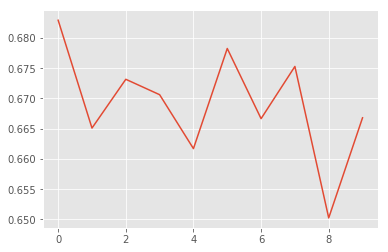

In [154]:
plt.plot(v1_vgg_hist.epoch, v1_vgg_hist.history['acc'])

* This model sucks, not sure exactly why, it should at least kinda ok?
* Turned learning rate up to 0.1 -> got below 0.6 in loss
* Turned up to 1 -> Doing way better better now

## Validation
* Should make note of final scores on val set - use `model.evaluation_generator()`
* Should view...
    * Random correct sample
    * Random incorrect sample
    * Most right pred images in each class
    * Most wrong pred images in each class
    * Most unsure pred images

In [76]:
import pandas as pd
from keras.preprocessing import image

In [57]:
v1_vgg.evaluate_generator(val_gen, val_gen.nb_batches)

[0.20366474229097367, 0.93499999129772182]

In [65]:
preds = v1_vgg.predict_generator(val_gen, val_gen.nb_batches)

In [66]:
preds[:2]

array([[ 0.94372314,  0.05627688],
       [ 0.84907293,  0.15092707]], dtype=float32)

In [67]:
val_gen.classes[:2]

array([0, 0], dtype=int32)

In [68]:
preds[:2,1]

array([ 0.05627688,  0.15092707], dtype=float32)

In [69]:
print(len(preds), len(val_gen.filenames))

2000 2000


In [70]:
df_preds = pd.DataFrame({'filename':val_gen.filenames,
                         'pred_dog':preds[:,1],
                         'pred_cat':preds[:,0],
                         'class':val_gen.classes}
                       ).astype({'class':np.uint8})

In [71]:
df_preds.head()

,class,filename,pred_cat,pred_dog
0,0,cats/cat.9182.jpg,0.943723,0.056277
1,0,cats/cat.5169.jpg,0.849073,0.150927
2,0,cats/cat.177.jpg,0.859145,0.140855
3,0,cats/cat.328.jpg,0.990697,0.009303
4,0,cats/cat.7954.jpg,0.738261,0.261739


In [73]:
df_preds = df_preds.assign(pred_class = lambda x: x['pred_dog'].round().astype(np.uint8)
               ).assign(correct = lambda x: x['pred_class'] == x['class'])

In [74]:
df_preds.head()

,class,filename,pred_cat,pred_dog,pred_class,correct
0,0,cats/cat.9182.jpg,0.943723,0.056277,0,True
1,0,cats/cat.5169.jpg,0.849073,0.150927,0,True
2,0,cats/cat.177.jpg,0.859145,0.140855,0,True
3,0,cats/cat.328.jpg,0.990697,0.009303,0,True
4,0,cats/cat.7954.jpg,0.738261,0.261739,0,True


In [159]:
def plot_df_images(df):
    n_plots = len(df)
    n_plot_rows = ceil(n_plots/4)
    fig = plt.figure()
    axes_idx = 1
    for i, row in df.iterrows():
        a=fig.add_subplot(n_plot_rows,4,axes_idx)
        plt.imshow(image.load_img(DATA_PATH+'val/'+row['filename']))
        a.set_title(row)
        a.grid(False)
        axes_idx +=1
    fig.set_size_inches(22,5*n_plot_rows)
    plt.subplots_adjust(hspace=0.5)
    plt.show()
        

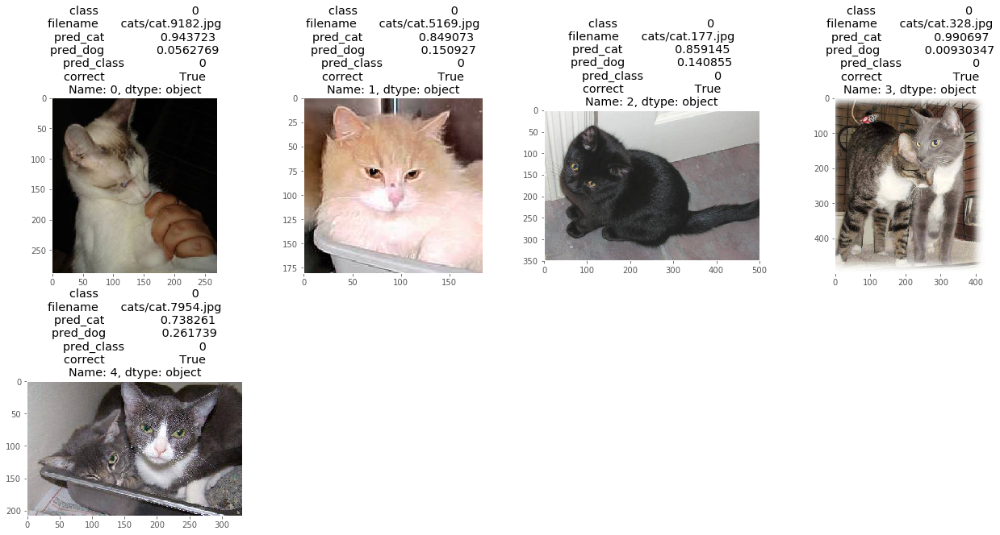

In [161]:
plot_df_images(df_preds.head())

In [179]:
def investigate_preds(df):
    print('======= 1. Random correct sample ========')
    plot_df_images(df[df.correct == True].sample(4))
    print('======= 2. Random incorrect sample ========')
    plot_df_images(df[df.correct == False].sample(4))
    print('======= 3. Most right pred images in each class ========')
    plot_df_images(df[(df.correct == True)
                      & (df['class'] == 0)]
                      .sort_values(by='pred_cat', ascending=False).head(4))
    plot_df_images(df[(df.correct == True)
                      & (df['class'] == 1)]
                      .sort_values(by='pred_dog', ascending=False).head(4))
    print('======= 4. Most wrong pred images in each class ========')
    plot_df_images(df[(df.correct == False)
                      & (df['class'] == 0)]
                      .sort_values(by='pred_cat', ascending=True).head(4))
    plot_df_images(df[(df.correct == False)
                      & (df['class'] == 1)]
                      .sort_values(by='pred_dog', ascending=True).head(4))
    print('======= 5. Most unsure pred imagee ========')
    plot_df_images(df.assign(abs_diff = lambda x: abs(x.pred_cat - x.pred_dog))
                             .sort_values(by='abs_diff', ascending=True).head(8))

======= 1. Random correct sample ========


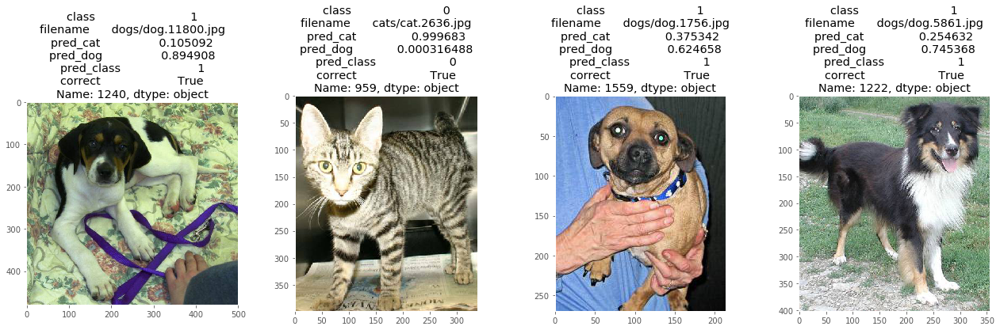

======= 2. Random incorrect sample ========


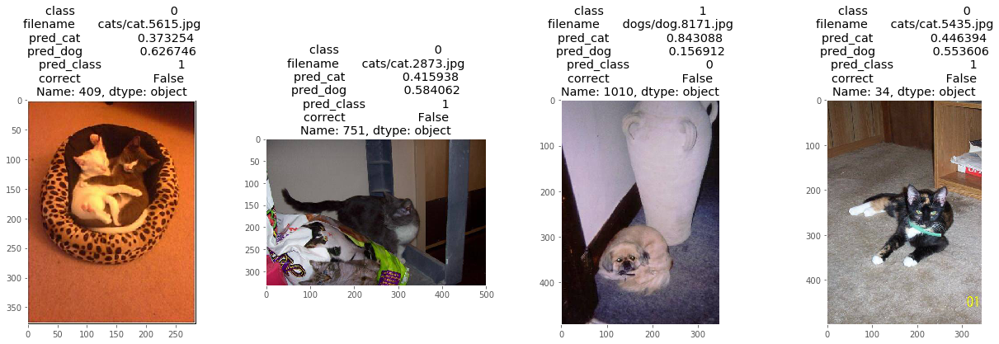

======= 3. Most right pred images in each class ========


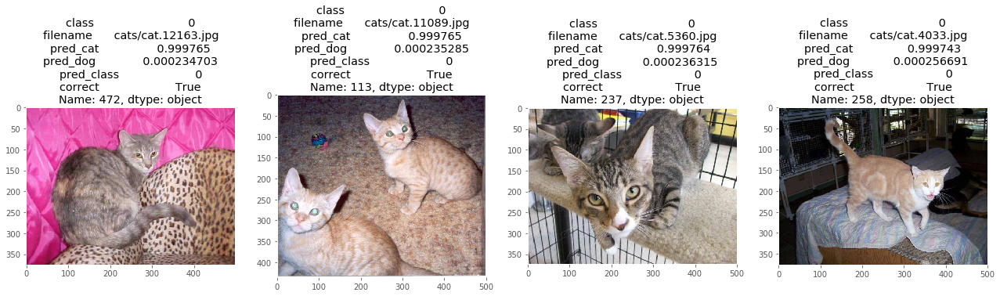

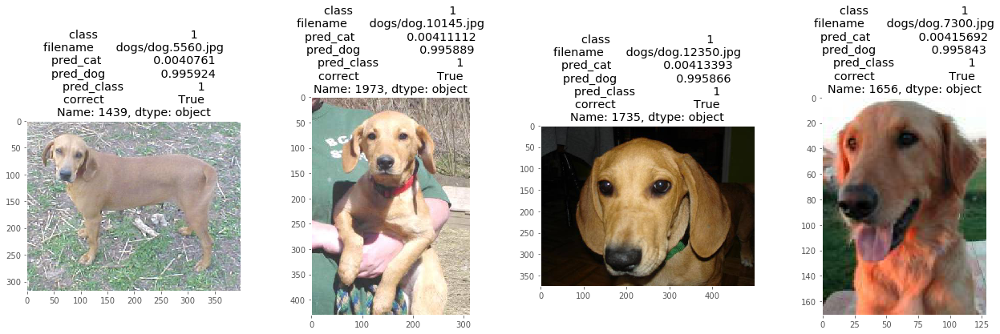

======= 4. Most wrong pred images in each class ========


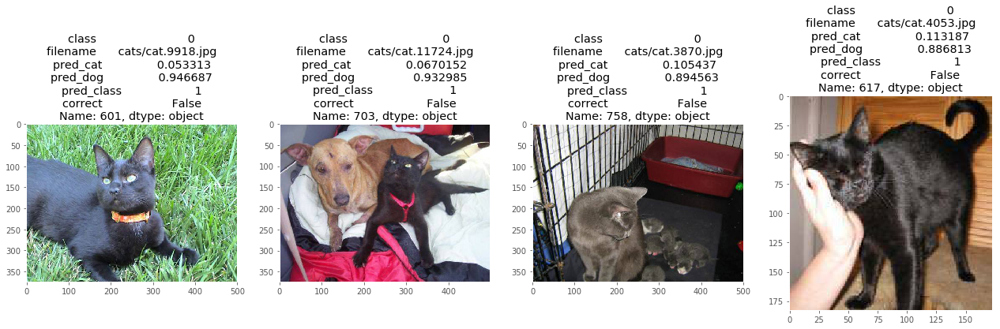

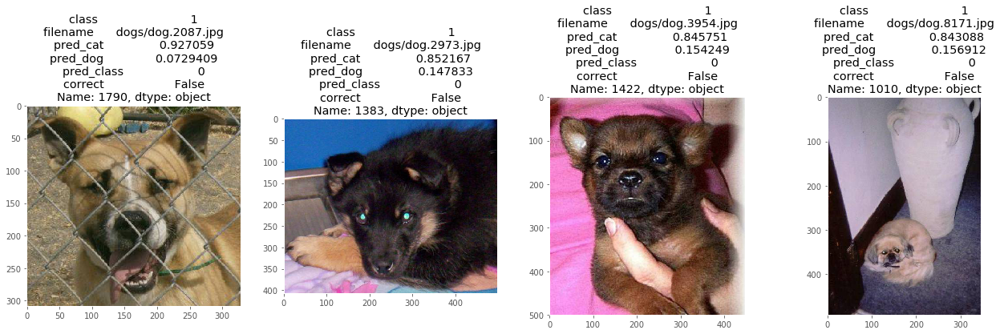

======= 5. Most unsure pred imagee ========


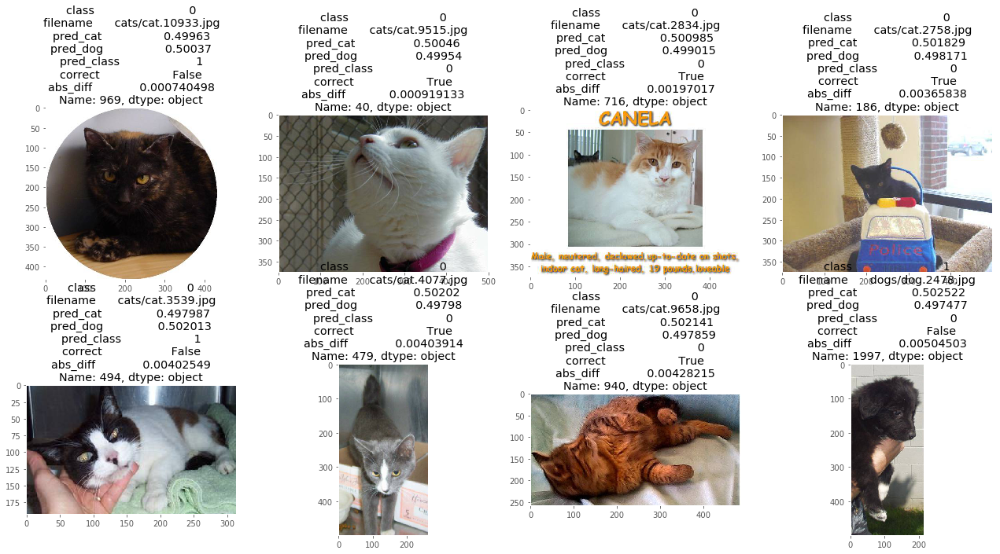

In [180]:
investigate_preds(df_preds)

### Summary stats to look at:
* Fraction of each class wrong/right
* Histograms of preds
    * Same for wrongs and rights (see if wrongs are unsure or are super wrong)
* More more more, investigate the hunches etc.


## Submission
* Make test generator
* Get preds
* Make submission df and then to csv

In [182]:
!head {DATA_PATH}sample_submission.csv

id,label
1,0.5
2,0.5
3,0.5
4,0.5
5,0.5
6,0.5
7,0.5
8,0.5
9,0.5


In [181]:
test_gen = img_gen.flow_from_directory(DATA_PATH+'test/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=124, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
test_gen.nb_batches = int(ceil(test_gen.samples / test_gen.batch_size))
test_gen.nb_batches

Found 12500 images belonging to 1 classes.


101

In [183]:
preds = v1_vgg.predict_generator(test_gen, test_gen.nb_batches)

In [185]:
df_preds = pd.DataFrame({'filename':test_gen.filenames,
                         'label':preds[:,1]})
df_preds.head()

,filename,label
0,unknown/5180.jpg,0.746978
1,unknown/1418.jpg,0.095118
2,unknown/6690.jpg,0.009229
3,unknown/4969.jpg,0.965985
4,unknown/160.jpg,0.863151


In [187]:
df_preds['id'] = df_preds.filename.map(lambda x: x.split('/')[1].split('.')[0])

In [189]:
df_preds[['id','label']].to_csv(MODEL_PATH+'1_v1_vgg_sub1.csv', index=False)

In [190]:
!head {MODEL_PATH}1_v1_vgg_sub1.csv

id,label
5180,0.7469777464866638
1418,0.09511763602495193
6690,0.009228586219251156
4969,0.965985119342804
160,0.8631510734558105
2467,0.800140917301178
4675,0.8928508758544922
6999,0.9954310655593872
5923,0.7834569811820984


In [191]:
!kg submit {MODEL_PATH}1_v1_vgg_sub1.csv
#0.21600

* cba doing most of it, wanna just straight to 4.
* but not going to use whole network

# 4. Try only using up to block 3, and retraining entire net
* Rationale being that the model needs much less possible variance than for `image_net`
* Fine-tune/partially retain some of the lower level filters to be more suited to cats dogs (assumption that at the level I cut model off the filters have already specialised beyond that)

In [43]:
import keras
from keras.layers.core import Dense, Flatten
from keras.models import Model
from keras.optimizers import SGD
from keras.utils.data_utils import get_file
from keras.preprocessing.image import ImageDataGenerator
from math import ceil

In [37]:
# could have used `include_top=False` and then set `input_shape`
vgg = keras.applications.vgg16.VGG16(include_top=True, weights=None,
                               input_tensor=None, input_shape=None,
                               pooling=None, classes=1000)

In [38]:
vgg.load_weights(full_weights_path)

In [39]:
vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [41]:
vgg.output

<tf.Tensor 'predictions/Softmax:0' shape=(?, 1000) dtype=float32>

In [49]:
vgg.get_layer('block3_pool')

In [46]:
vgg.get_layer('fc1').get_config()

{'activation': 'relu',
 'activity_regularizer': None,
 'bias_constraint': None,
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'bias_regularizer': None,
 'kernel_constraint': None,
 'kernel_initializer': {'class_name': 'VarianceScaling',
  'config': {'distribution': 'uniform',
   'mode': 'fan_avg',
   'scale': 1.0,
   'seed': None}},
 'kernel_regularizer': None,
 'name': 'fc1',
 'trainable': True,
 'units': 4096,
 'use_bias': True}

In [62]:
x = vgg.get_layer('block3_pool').output
x = Flatten(name='flatten')(x)
x = Dense(4000, activation='relu', name='fc1')(x)
x = Dense(4000, activation='relu', name='fc2')(x)
x = Dense(2, activation='softmax', name='predictions')(x)

In [63]:
v2_vgg = Model(inputs=vgg.input, outputs=x)

In [64]:
for layer in vgg.layers:
    layer.trainable = False

In [65]:
v2_vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

# NOTE: this has a crazy amount of params
* It has ~7 times more than full vgg16 (a model which already have a shit load of params
* Should expect this to train really slow
* Now all the params are basically in that first fc1 layer (802820000) of them
* This is because each convolution block, though it doubles the number of filters (depth -> (height,weight,depth)) of the tensor
    * the previous MaxPooling2D halves both the width and height DUE to the `strides(2,2)`

In [67]:
sgd = SGD(lr=1, momentum=0.5, decay=0.0, nesterov=False)
v2_vgg.compile(loss='categorical_crossentropy', # set the loss to optimize
               optimizer=sgd, # set optimization method
               metrics=['accuracy'] # sets metric to report (not used in computations though)
              )

In [71]:
img_gen = ImageDataGenerator()
train_gen = img_gen.flow_from_directory(DATA_PATH+'train/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=124, # default is 32
                                      shuffle=True,
                                      seed=2017 # for reproducing
                                     )
train_gen.nb_batches = int(ceil(train_gen.samples / train_gen.batch_size))

Found 23000 images belonging to 2 classes.


In [70]:
img_gen = ImageDataGenerator()
val_gen = img_gen.flow_from_directory(DATA_PATH+'val/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=124, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
val_gen.nb_batches = int(ceil(val_gen.samples / val_gen.batch_size))

Found 2000 images belonging to 2 classes.


17

In [72]:
v2_vgg_hist = v2_vgg.fit_generator(train_gen, train_gen.nb_batches, epochs=1,
                    verbose=1,
                    validation_data=val_gen, validation_steps=val_gen.nb_batches)

Epoch 1/1


ResourceExhaustedError: OOM when allocating tensor with shape[200704,2000]
	 [[Node: fc1_2/random_uniform/RandomUniform = RandomUniform[T=DT_INT32, dtype=DT_FLOAT, seed=87654321, seed2=7208823, _device="/job:localhost/replica:0/task:0/gpu:0"](fc1_2/random_uniform/shape)]]

Caused by op 'fc1_2/random_uniform/RandomUniform', defined at:
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start
    ioloop.IOLoop.instance().start()
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 235, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2698, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2802, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2862, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-52-63f9501606d5>", line 3, in <module>
    x = Dense(2000, activation='relu', name='fc1')(x)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/keras/engine/topology.py", line 528, in __call__
    self.build(input_shapes[0])
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/keras/layers/core.py", line 827, in build
    constraint=self.kernel_constraint)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/keras/engine/topology.py", line 364, in add_weight
    weight = K.variable(initializer(shape), dtype=K.floatx(), name=name)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/keras/initializers.py", line 205, in __call__
    dtype=dtype, seed=self.seed)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py", line 3146, in random_uniform
    dtype=dtype, seed=seed)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tensorflow/python/ops/random_ops.py", line 236, in random_uniform
    shape, dtype, seed=seed1, seed2=seed2)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tensorflow/python/ops/gen_random_ops.py", line 249, in _random_uniform
    seed=seed, seed2=seed2, name=name)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 2506, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/ubuntu/miniconda3/envs/basev1/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1269, in __init__
    self._traceback = _extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[200704,2000]
	 [[Node: fc1_2/random_uniform/RandomUniform = RandomUniform[T=DT_INT32, dtype=DT_FLOAT, seed=87654321, seed2=7208823, _device="/job:localhost/replica:0/task:0/gpu:0"](fc1_2/random_uniform/shape)]]


### Result: couldn't even hold model in GPU memory

# 4.a Try using network without top (just filters), and retraining entire net
* Rationale being that the model needs much less possible variance than for `image_net`
* Fine-tune/partially retain some of the lower level filters to be more suited to cats dogs (assumption that at the level I cut model off the filters have already specialised beyond that)
    * Must assume now that the filters have already specialised!

In [10]:
import keras
from keras.layers.core import Dense, Flatten
from keras.models import Model
from keras.optimizers import SGD, Adam
from keras.utils.data_utils import get_file
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras import backend as K
import pandas as pd
from math import ceil

In [24]:
#K.clear_session()
# didn't work as expected
# expected:
    # run it and then GPU is flushed - didn't happen - still got resources overload when wasnt getting previously

In [25]:
# could have used `include_top=False` and then set `input_shape`
vgg = keras.applications.vgg16.VGG16(include_top=True, weights='imagenet',
                               input_tensor=None, input_shape=None,
                               pooling=None, classes=1000)

In [26]:
#vgg.load_weights(full_weights_path)

In [27]:
vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [28]:
vgg.output

<tf.Tensor 'predictions_1/Softmax:0' shape=(?, 1000) dtype=float32>

In [29]:
x = vgg.get_layer('block5_pool').output
x = Flatten(name='nflatten')(x)
x = Dense(4096, activation='relu', name='nfc1')(x)
x = Dense(4096, activation='relu', name='nfc2')(x)
x = Dense(2, activation='softmax', name='npredictions')(x)

In [30]:
v3_vgg = Model(inputs=vgg.input, outputs=x)

In [31]:
for layer in vgg.layers:
    layer.trainable = False

In [32]:
v3_vgg.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [33]:
# let's use new optmizer 
# Adam is a variant of SGD (think?) which uses running avs of gradients and second moments of them
adam = Adam(lr=1e-6)
v3_vgg.compile(loss='categorical_crossentropy', # set the loss to optimize
               optimizer=adam, # set optimization method
               metrics=['accuracy'] # sets metric to report (not used in computations though)
              )

In [34]:
img_gen = ImageDataGenerator()
train_gen = img_gen.flow_from_directory(DATA_PATH+'train/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=64, # default is 32
                                      shuffle=True,
                                      seed=2017 # for reproducing
                                     )
train_gen.nb_batches = int(ceil(train_gen.samples / train_gen.batch_size))

Found 23000 images belonging to 2 classes.


In [35]:
img_gen = ImageDataGenerator()
val_gen = img_gen.flow_from_directory(DATA_PATH+'val/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=64, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
val_gen.nb_batches = int(ceil(val_gen.samples / val_gen.batch_size))

Found 2000 images belonging to 2 classes.


In [36]:
# resource exhaust -> made batch size 64
# resource exhaust -> made batch size 32
# resource exhaust -> made batch size 1
# made batch -> 128: managed to train for 2 epoches?
# batch -> 64: training now
v3_vgg_hist = v3_vgg.fit_generator(train_gen, train_gen.nb_batches, epochs=1,
                    verbose=1,
                    validation_data=val_gen, validation_steps=val_gen.nb_batches)
# BAD lr=1
    # 360/360 [==============================] - 384s - loss: 8.0530 - acc: 0.5004 - val_loss: 8.1155 - val_acc: 0.4965
# lr=0.1
    # still stuck at 0.5
# lr=1e-6 BINGO
    # 360/360 [==============================] - 383s - loss: 0.7929 - acc: 0.8868 - val_loss: 0.3934 - val_acc: 0.9445

Epoch 1/1
360/360 [==============================] - 383s - loss: 0.7929 - acc: 0.8868 - val_loss: 0.3934 - val_acc: 0.9445


In [37]:
v3_vgg_hist = v3_vgg.fit_generator(train_gen, train_gen.nb_batches, epochs=1,
                    verbose=1,
                    validation_data=val_gen, validation_steps=val_gen.nb_batches)
# 360/360 [==============================] - 378s - loss: 0.2104 - acc: 0.9679 - val_loss: 0.3452 - val_acc: 0.9515
# already overfit - lets submit

Epoch 1/1
360/360 [==============================] - 378s - loss: 0.2104 - acc: 0.9679 - val_loss: 0.3452 - val_acc: 0.9515


In [38]:
# looks like it's not training, bets are it's stuck in a predicting only 1s or zeros 
# haha just found that the weight loading didn't work... so was stuck unable to train a randomised init...

In [39]:
img_gen = ImageDataGenerator()
val_gen = img_gen.flow_from_directory(DATA_PATH+'val/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=64, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
val_gen.nb_batches = int(ceil(val_gen.samples / val_gen.batch_size))

Found 2000 images belonging to 2 classes.


In [40]:
v3_vgg.evaluate_generator(val_gen, val_gen.nb_batches)

[0.34520096689928326, 0.95150000000000001]

In [41]:
preds = v3_vgg.predict_generator(val_gen, val_gen.nb_batches)

In [42]:
preds[:2]

array([[  9.99635816e-01,   3.64206004e-04],
       [  1.00000000e+00,   5.11775877e-16]], dtype=float32)

In [43]:
val_gen.classes[:2]

array([0, 0], dtype=int32)

In [44]:
preds[:2,1]

array([  3.64206004e-04,   5.11775877e-16], dtype=float32)

In [45]:
print(len(preds), len(val_gen.filenames))

2000 2000


In [46]:
df_preds = pd.DataFrame({'filename':val_gen.filenames,
                         'pred_dog':preds[:,1],
                         'pred_cat':preds[:,0],
                         'class':val_gen.classes}
                       ).astype({'class':np.uint8})

In [47]:
df_preds = df_preds.assign(pred_class = lambda x: x['pred_dog'].round().astype(np.uint8)
               ).assign(correct = lambda x: x['pred_class'] == x['class'])

In [48]:
def plot_df_images(df):
    n_plots = len(df)
    n_plot_rows = ceil(n_plots/4)
    fig = plt.figure()
    axes_idx = 1
    for i, row in df.iterrows():
        a=fig.add_subplot(n_plot_rows,4,axes_idx)
        plt.imshow(image.load_img(DATA_PATH+'val/'+row['filename']))
        a.set_title(row)
        a.grid(False)
        axes_idx +=1
    fig.set_size_inches(22,5*n_plot_rows)
    plt.subplots_adjust(hspace=0.5)
    plt.show()
        

In [49]:
def investigate_preds(df):
    print('======= 1. Random correct sample ========')
    plot_df_images(df[df.correct == True].sample(4))
    print('======= 2. Random incorrect sample ========')
    plot_df_images(df[df.correct == False].sample(4))
    print('======= 3. Most right pred images in each class ========')
    plot_df_images(df[(df.correct == True)
                      & (df['class'] == 0)]
                      .sort_values(by='pred_cat', ascending=False).head(4))
    plot_df_images(df[(df.correct == True)
                      & (df['class'] == 1)]
                      .sort_values(by='pred_dog', ascending=False).head(4))
    print('======= 4. Most wrong pred images in each class ========')
    plot_df_images(df[(df.correct == False)
                      & (df['class'] == 0)]
                      .sort_values(by='pred_cat', ascending=True).head(4))
    plot_df_images(df[(df.correct == False)
                      & (df['class'] == 1)]
                      .sort_values(by='pred_dog', ascending=True).head(4))
    print('======= 5. Most unsure pred imagee ========')
    plot_df_images(df.assign(abs_diff = lambda x: abs(x.pred_cat - x.pred_dog))
                             .sort_values(by='abs_diff', ascending=True).head(8))

======= 1. Random correct sample ========


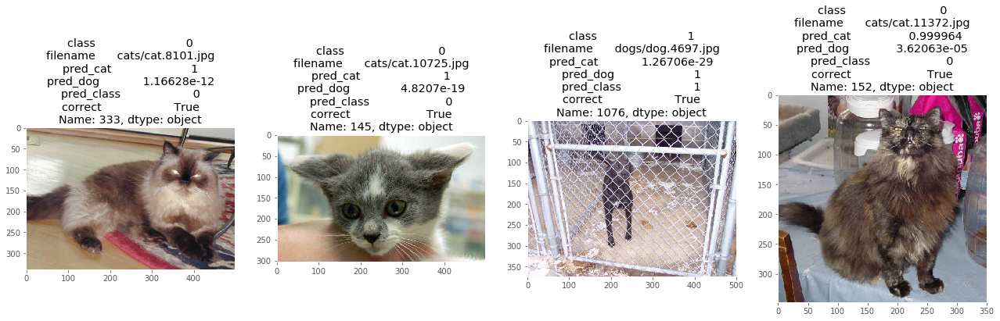

======= 2. Random incorrect sample ========


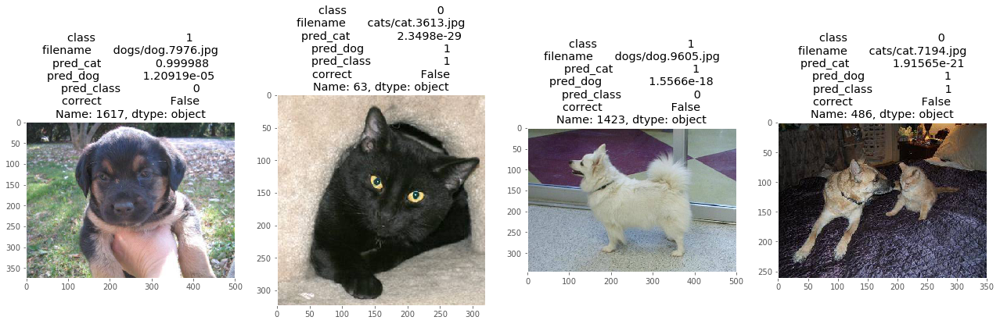

======= 3. Most right pred images in each class ========


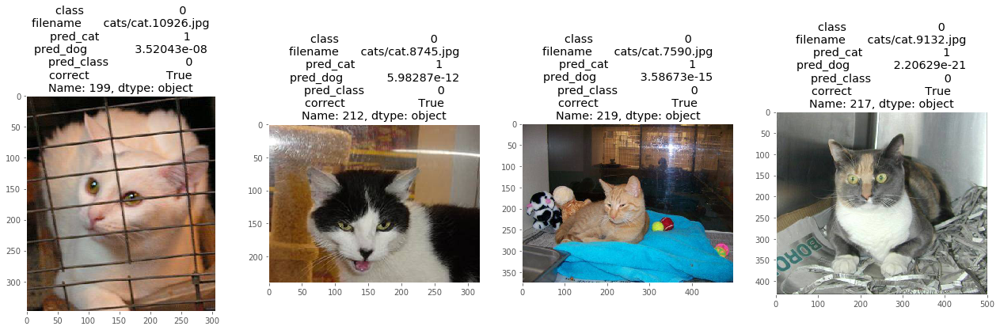

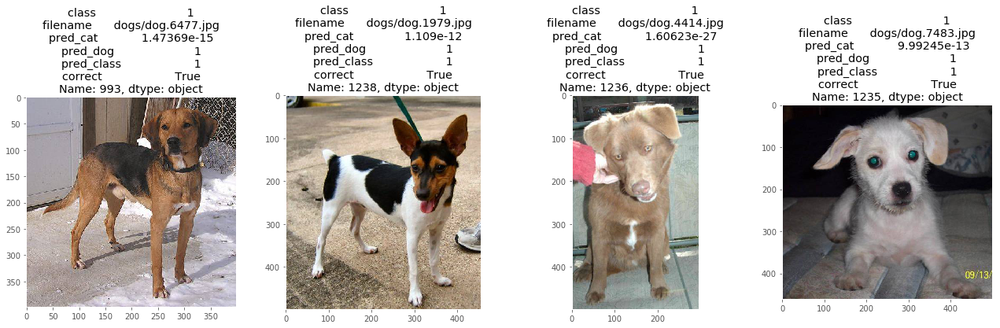

======= 4. Most wrong pred images in each class ========


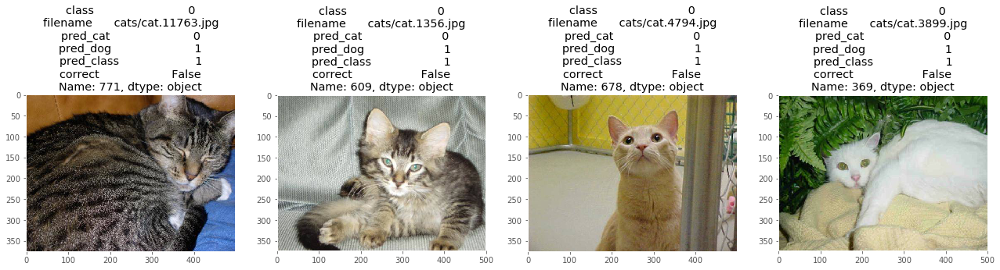

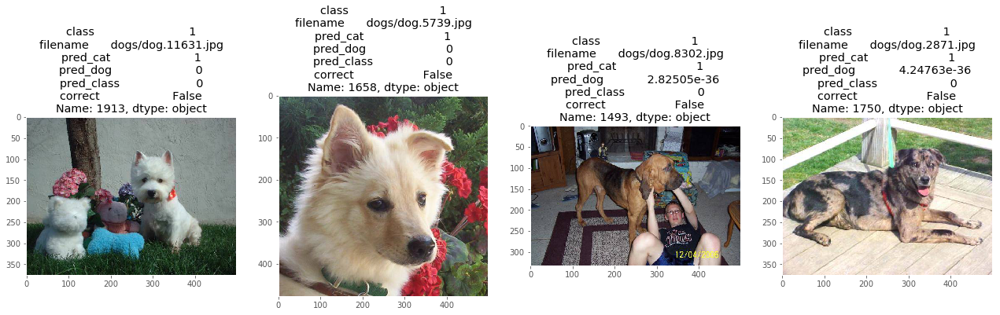

======= 5. Most unsure pred imagee ========


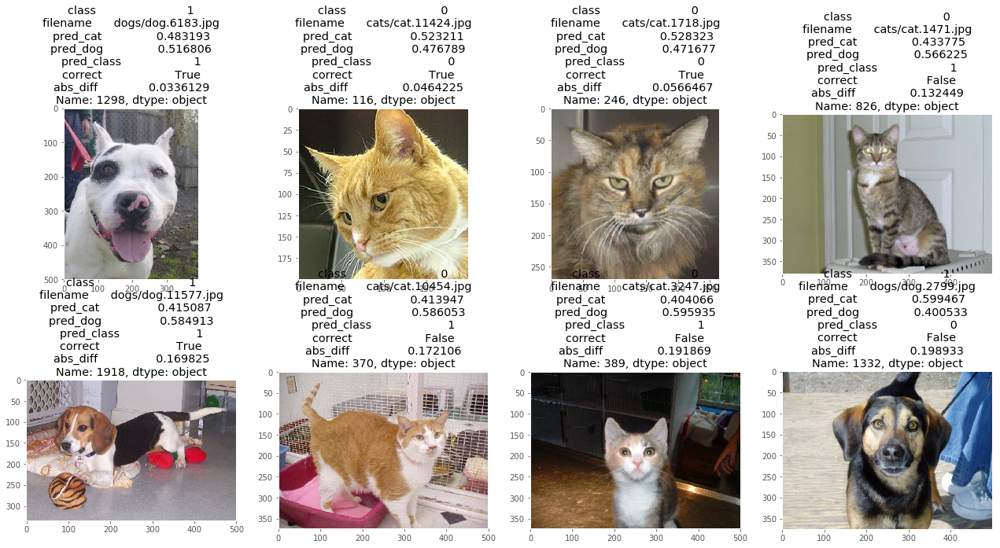

In [50]:
investigate_preds(df_preds)

In [51]:
test_gen = img_gen.flow_from_directory(DATA_PATH+'test/',
                                      target_size= (224,224), # this should match the input layer size
                                      color_mode='rgb', # alternative is 'grayscale'
                                      classes=None, # will infere them from directory structure
                                      class_mode='categorical',
                                      batch_size=64, # default is 32
                                      shuffle=False,
                                      seed=2017 # for reproducing
                                     )
test_gen.nb_batches = int(ceil(test_gen.samples / test_gen.batch_size))
test_gen.nb_batches

Found 12500 images belonging to 1 classes.


196

In [52]:
preds = v3_vgg.predict_generator(test_gen, test_gen.nb_batches)

In [53]:
df_preds = pd.DataFrame({'filename':test_gen.filenames,
                         'label':preds[:,1]})
df_preds.head()

,filename,label
0,unknown/5180.jpg,1.000000e+00
1,unknown/1418.jpg,1.220464e-14
2,unknown/6690.jpg,8.197608e-10
3,unknown/4969.jpg,1.000000e+00
4,unknown/160.jpg,1.000000e+00


In [54]:
df_preds['id'] = df_preds.filename.map(lambda x: x.split('/')[1].split('.')[0])

In [55]:
df_preds[['id','label']].to_csv(MODEL_PATH+'1_v3_vgg_sub1.csv', index=False)

In [56]:
!head {MODEL_PATH}1_v3_vgg_sub1.csv

id,label
5180,1.0
1418,1.2204635156773565e-14
6690,8.197608147852975e-10
4969,1.0
160,1.0
2467,1.0
4675,1.0
6999,1.0
5923,0.9995185136795044


In [57]:
!kg submit {MODEL_PATH}1_v3_vgg_sub1.csv
#0.50396

In [59]:
df_preds['label'] = df_preds.label.clip(0.05,0.95)

In [60]:
df_preds[['id','label']].to_csv(MODEL_PATH+'1_v31_vgg_sub1.csv', index=False)

In [61]:
!head {MODEL_PATH}1_v31_vgg_sub1.csv

id,label
5180,0.949999988079071
1418,0.05000000074505806
6690,0.05000000074505806
4969,0.949999988079071
160,0.949999988079071
2467,0.949999988079071
4675,0.949999988079071
6999,0.949999988079071
5923,0.949999988079071


In [62]:
!kg submit {MODEL_PATH}1_v31_vgg_sub1.csv
#0.20364

In [ ]:
# bored now

#### Result: still too big to train it?
* Nope... You just needed to del that huge model that was still chillin in the GPU...
# Result: got stuck in the 0.5 accuracy jam again...
# Solved:  by reducing learning rate from 0.001 to 1e-6
## Reflection on this issue
I've had this issue a number of times now, so thought to make a little recap of it and possible solutions etc. to help people in the future. 

**Issue**: Model predicts one of the 2 (or more) possible classes for all data it sees*

**Confirming issue is occurring**: _Method 1:_ accuracy for model stays around 0.5 while training (or 1/n where n is number of classes). _Method 2:_ Get the counts of each class in predictions and confirm it's predicting all one class.

**Fixes/Checks** (in somewhat of an order):

* **Double Check Model Architecture**: use `model.summary()`, inspect the model.
* **Check Data Labels**: make sure the labelling of your train data hasn't got mixed up somewhere in the preprocessing etc. (it happens!)
* **Check Train Data Feeding Is Randomised**: make sure you are not feeding your train data to the model one class at a time. For instance if using `ImageDataGenerator().flow_from_directory(PATH)`, check that param `shuffle=True` and that `batch_size` is greater than 1.
* **Check Pre-Trained Layers Are Not Trainable**:** If using a pre-trained model, ensure that any layers that use pre-trained weights are NOT _initially_ trainable. For the first epochs, only the newly added (randomly initialised) layers should be trainable; `for layer in pretrained_model.layers: layer.trainable = False` should be somewhere in your code.
* **Ramp Down Learning Rate**: Keep reducing your learning rate by factors of 10 and retrying. Note you will have to fully reinitialize the layers you are trying to train each time you try a new learning rate. (For instance, I had this issue that was only solved once I got down to `lr=1e-6`, so keep going!)

If any of you know of more fixes/checks that could possible get the model training properly then please do contribute and I'll try to update the list.

**Note that is common to make more of the pretrained model trainable, once the new layers have been initially trained "enough"

*Other names for the issue to help searches get here...
keras tensorflow theano CNN convolutional neural network bad training stuck fixed not static broken bug bugged jammed training optimization optimisation only 0.5 accuracy does not change only predicts one single class wont train model stuck on class model resetting itself between epochs keras CNN same output
